# **Hotel Reservation** 
- **Project Type** : EDA
- **Contribution** : Individual
- **Created by** : Rishabh Salian

# **Project Summary**
This project involved a comprehensive analysis of a hotel booking dataset containing 119,390 records and 32 attributes for two types of hotels: City Hotels and Resort Hotels.

**Data Assessment & Cleaning**
The initial data assessment revealed a mix of data types (object, float64, int64), along with significant data quality issues:

- Duplicate Records: 31,994 duplicate entries were identified and removed.

- Missing Values: Four columns contained null values. The company column had the most (112,593), followed by agent, country, and children (which had only 4 missing values).

**Data Processing Workflow**
The project followed a structured data manipulation pipeline:

- Data Collection: Initial exploration using functions like head(), tail(), info(), describe(), and columns().

- Data Cleaning & Transformation: Addressed quality issues by imputing missing values and removing duplicates. Additionally:

    - Rows with zero guests (where adults, children, and babies all equaled 0) were dropped as they represented invalid bookings.

    - The reservation_status_date column was converted from an object to a datetime data type.

    - New columns were engineered for analysis, including total_guests and total_stay.

**Exploratory Data Analysis (EDA) & Visualization**
A thorough exploratory analysis was conducted following the UBM framework:

- Univariate Analysis: Understanding the distribution of individual variables.

- Bivariate Analysis: Examining relationships between two variables, covering all combinations (Numerical-Categorical, Numerical-Numerical, Categorical-Categorical).

- Multivariate Analysis: Investigating more complex interactions between multiple variables.

Various charts and a correlation matrix were used to uncover key patterns and insights. The goal of this visualization was to translate raw data into actionable business intelligence that could drive growth and improve decision-making for the hotels.

***"Through meticulous data cleaning and multi-faceted exploration, this analysis uncovered the critical factors that influence hotel bookings, providing valuable insights to support strategic business development."***

# **Problem Statement**

- **Have you ever wondered when the best time of year to book a hotel room is?**
- **Or the optimal length of stay in order to get the best daily rate?**
- **What if you wanted to predict whether or not a hotel was likely to receive a disproportionately high number of special requests?**

This hotel booking dataset can help you explore those questions. This data set contains booking information for a city hotel and a resort hotel, and includes information such as when the booking was made, length of stay, the number of adults, children, and/or babies, and the number of available parking spaces, among other things. All personally identifying information has been removed from the data.

# **Define the Business Objective?**
**Explore and Analyze the data to discover important factors that governs the bookings.**

# **Project**

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

## Exploring Data

In [2]:
# Load Dataset into DataFrame
data = pd.read_csv(r"C:\Users\cereb\OneDrive\Documents\Rishabh\Projects\Hotel Reservation\Data\hotel_bookings(in).csv")

# Create a backup of the Dataframe
data_original = data.copy()

# Showcase the Total Number of Rows and COlumns in the Data
print("-"*60)
print(f"Total Rows in Dataset :{data.shape[0]}")
print(f"Total Columns in Dataset :{data.shape[1]}")
print("-"*60)


print("Basic column information:")
pd.set_option('display.max_columns',None)
pd.set_option('display.width',None)
pd.set_option('display.max_colwidth',None)

data.head()

------------------------------------------------------------
Total Rows in Dataset :119390
Total Columns in Dataset :32
------------------------------------------------------------
Basic column information:


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,7/3/2015


**Let's understand the columns now:**
------------------------------------------------------------
- ***hotel:*** *Type of hotel (e.g., Resort Hotel or City Hotel).*
- ***is_canceled:*** *Indicates whether the booking was canceled (1) or not (0).*
- ***lead_time:*** *Number of days between booking and arrival.*
- ***arrival_date_year:*** *Year of arrival.*
- ***arrival_date_month:*** *Month of arrival.*
- ***arrival_date_week_number:*** *Week number of the year for arrival.*
- ***arrival_date_day_of_month:*** *Day of the month of arrival.*
- ***stays_in_weekend_nights:*** *Number of weekend nights stayed.*
- ***stays_in_week_nights:*** *Number of weekday nights stayed.*
- ***adults:*** *Number of adults.*
- ***children:*** *Number of children.*
- ***babies:*** *Number of infants.*
- ***meal:*** *Type of meal option booked.*
- ***country:*** *Country of origin of the guest (ISO code).*
- ***market_segment:*** *Market segment designation (e.g., Direct, Online TA).*
- ***distribution_channel:*** *Booking distribution channel (e.g., TA/TO, Direct).*
- ***is_repeated_guest:*** *Indicates if the guest is repeated (1) or not (0).*
- ***previous_cancellations:*** *Number of previous cancellations by the guest.*
- ***previous_bookings_not_canceled:*** *Number of prior bookings not canceled.*
- ***reserved_room_type:*** *Room type reserved by the guest.*
- ***assigned_room_type:*** *Room type actually assigned.*
- ***booking_changes:*** *Number of changes made to the booking.*
- ***deposit_type:*** *Type of deposit made (e.g., No Deposit, Non Refund).*
- ***agent:*** *ID of the travel agency that made the booking (NULL if none).*
- ***company:*** *ID of the company/entity that made the booking (NULL if none).*
- ***days_in_waiting_list:*** *Number of days the booking was on the waiting list.*
- ***customer_type:*** *Type of customer (e.g., Transient, Contract).*
- ***adr:*** *Average Daily Rate (numeric).*
- ***required_car_parking_spaces:*** *Number of car parking spaces required.*
- ***total_of_special_requests:*** *Number of special requests made.*
- ***reservation_status:*** *Current status of the reservation (e.g., Check-Out, Canceled).*
- ***reservation_status_date:*** *Date of the last status update.*

In [3]:
# Get unique values for categorical columns, excluding specified columns
columns = data.columns.tolist()
columns_to_exclude = ["lead_time", "arrival_date_week_number", "arrival_date_day_of_month",
                        "stays_in_weekend_nights", "stays_in_week_nights", "previous_bookings_not_canceled",
                        "agent", "company", "days_in_waiting_list", "adr", "reservation_status_date"]

# Remove specified columns from the list if they exist
for col in columns_to_exclude:
      columns.remove(col)
    
print("-" * 60)
for column in columns:
    unique_values = data[column].unique()
    print(f"Unique values for column '{column}':")
    print(unique_values)
    print("-" * 30)
print("-" * 60)

------------------------------------------------------------
Unique values for column 'hotel':
['Resort Hotel' 'City Hotel']
------------------------------
Unique values for column 'is_canceled':
[0 1]
------------------------------
Unique values for column 'arrival_date_year':
[2015 2016 2017]
------------------------------
Unique values for column 'arrival_date_month':
['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June']
------------------------------
Unique values for column 'adults':
[ 2  1  3  4 40 26 50 27 55  0 20  6  5 10]
------------------------------
Unique values for column 'children':
[ 0.  1.  2. 10.  3. nan]
------------------------------
Unique values for column 'babies':
[ 0  1  2 10  9]
------------------------------
Unique values for column 'meal':
['BB' 'FB' 'HB' 'SC' 'Undefined']
------------------------------
Unique values for column 'country':
['PRT' 'GBR' 'USA' 'ESP' 'IRL' 'FRA' nan 'ROU' 'NOR' 'OMN' 'A

In [4]:
# Understand the Data Structure
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

**According to the Information Above among the 32 Columns in the Dataset we can find there are couple of Columns with Null values/Empty Data. This Bring us to perform Some Data CLeaning , but before that We need to confirm total number of NULL data and also to find is there are any issues like duplicate values in the Data for some thorough cleaning of the Data for better accuracy in the result.**

## Data Cleaning

In [5]:
# Check for specific string representations of missing values
missing_values_strings = ["nan", "na", "null"]

print("-"*60)
for col in data.columns:
    # Check if any of the missing value strings are present in the column (case-insensitive)
    has_missing_strings = data[col].astype(str).str.lower().isin(missing_values_strings).any()
    if has_missing_strings:
        print(f"Column '{col}' contains one or more of the specified missing value strings.")
print("-"*60)

------------------------------------------------------------
Column 'children' contains one or more of the specified missing value strings.
Column 'country' contains one or more of the specified missing value strings.
Column 'agent' contains one or more of the specified missing value strings.
Column 'company' contains one or more of the specified missing value strings.
------------------------------------------------------------


***"Let's fiind the number of Null values along with the percentage of NULL values in each columns to determine the cleaning process either to drop the NULL Entries or Fill it up."***

In [6]:
# Count missing values in the specified columns
columns_to_check = ['children', 'country', 'agent', 'company']
missing_counts = data[columns_to_check].isnull().sum()
null_count_perc = (missing_counts / len(data)) * 100
null_summary = pd.DataFrame({"Null Count" : missing_counts, "Null Percentage" : null_count_perc.round(2)})

print("-" * 60)
print("Missing value counts for the specified columns:")
print(null_summary)
print("-" * 60)

------------------------------------------------------------
Missing value counts for the specified columns:
          Null Count  Null Percentage
children           4             0.00
country          488             0.41
agent          16340            13.69
company       112593            94.31
------------------------------------------------------------


**So the Missing values are located in the children, country , agent and company columns so first we need to find a way to fill this missing values.**
- In Children there are only **4 values** missing which we can just drop since won't affect the data much.
- Same goes for the Country since it only consist of **0.41%** of missing vlaues in the entire data, So drop those entries won't have any major effects on the data and the result.
- As for the Agent Column which consist approx **14%** of the entry as missing values which is a gamble if we drop those entries it might effect the data and the result slightly, to avoid any such issues lets fill it out by it's mean value.
-  For the Company Column we can't ignore the major missing value of **94%** from the entire data so, as we are fill out the Agent column with it's mean value lets fill company with it's mean value.

In [7]:
# First lets drop the null entries of children and country
clean_data = data.copy()
clean_data = clean_data.dropna(subset=["children","country"])
clean_data = clean_data.fillna({"agent":data["agent"].mean(), "company": data["company"].mean()})

# Calculating the Null Values in Data along with its Percentage
null_count = clean_data.isnull().sum()
null_count_perc = (null_count / len(clean_data)) * 100

# Summaries in single Dataframe for side by side comparision
null_summary = pd.DataFrame({"Null Count" : null_count, "Null Percentage" : null_count_perc.round(2)})

# Printout the Results
print("-"*60)
print(null_summary)
print("-"*60)                                            

------------------------------------------------------------
                                Null Count  Null Percentage
hotel                                    0              0.0
is_canceled                              0              0.0
lead_time                                0              0.0
arrival_date_year                        0              0.0
arrival_date_month                       0              0.0
arrival_date_week_number                 0              0.0
arrival_date_day_of_month                0              0.0
stays_in_weekend_nights                  0              0.0
stays_in_week_nights                     0              0.0
adults                                   0              0.0
children                                 0              0.0
babies                                   0              0.0
meal                                     0              0.0
country                                  0              0.0
market_segment                         

**Great!, Now there are no missing values that can effect our data so we can continue further by  Spliting the Data into categorical and numeric Data.**
- *Also as we can see above the reservation_status_date have a incorrect datatype let's fix it along the way*
- *Before anything We have to check if the dataset have any duplicate values?*

In [8]:
# Check for duplicate values in each column and count them
duplicate_values = clean_data[clean_data.duplicated()]

print('-'*60)
print(f"Total Count of Duplicated values are {len(duplicate_values)}")
print('-'*60)

------------------------------------------------------------
Total Count of Duplicated values are 31958
------------------------------------------------------------


The duplicate values we identified, which make up over **25%** of the data *(31,958 entries)*, may be valid entries from classifier and key feature columns; therefore, dropping them could introduce major inaccuracies.

## Data Manipulation

In [9]:
# Creating a backup of the cleaned Data
clean_data["reservation_status_date"] = pd.to_datetime(clean_data["reservation_status_date"])
df = clean_data.copy() 

# Let's Split the dataframe into categorical and numeric data
categorical_data = df.select_dtypes(include=["object","category"])
numeric_data = df.select_dtypes(include=["int64", "float64"])
categorical_data.head()

,hotel,arrival_date_month,meal,country,market_segment,distribution_channel,reserved_room_type,assigned_room_type,deposit_type,customer_type,reservation_status
0,Resort Hotel,July,BB,PRT,Direct,Direct,C,C,No Deposit,Transient,Check-Out
1,Resort Hotel,July,BB,PRT,Direct,Direct,C,C,No Deposit,Transient,Check-Out
2,Resort Hotel,July,BB,GBR,Direct,Direct,A,C,No Deposit,Transient,Check-Out
3,Resort Hotel,July,BB,GBR,Corporate,Corporate,A,A,No Deposit,Transient,Check-Out
4,Resort Hotel,July,BB,GBR,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out


In [10]:
numeric_data.head()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,0,342,2015,27,1,0,0,2,0.0,0,0,0,0,3,86.693382,189.266735,0,0.0,0,0
1,0,737,2015,27,1,0,0,2,0.0,0,0,0,0,4,86.693382,189.266735,0,0.0,0,0
2,0,7,2015,27,1,0,1,1,0.0,0,0,0,0,0,86.693382,189.266735,0,75.0,0,0
3,0,13,2015,27,1,0,1,1,0.0,0,0,0,0,0,304.000000,189.266735,0,75.0,0,0
4,0,14,2015,27,1,0,2,2,0.0,0,0,0,0,0,240.000000,189.266735,0,98.0,0,1


**As we divided categorical Data from numeric data we can now identify couple of categorical keys features which we can use further.**
- First we can see in categorical data that arrival_date_month and reservation_status_date have a incorrect object datatype, so we need to fix it.
- Next, as we go through numeric data there are still some classification type numeric data arrival_date_year, like is_canceled & is_repeated_guest. 

**What did you know about your dataset?**
- This dataset contains 119390 rows and 32 columns.
- All the columns are divided into three dtypes: Oject,Float64 and int64.
- This datasheet does have duplicate as well as null values. There are total of 31958 duplicate values after cleaning the data and four columns have missing values.
- The maximum number of missing values are from "Company" column then followed by"Agent","Country" and "Children" columns. The "Children" columns cinsists of only 4 null values while "Company" column consists of 112593 null values.

In [11]:
# Let's add some final key features in the dataframe
df["total_stay"] = pd.to_numeric(df["stays_in_weekend_nights"]+ df["stays_in_week_nights"])
df["total_guest"] = pd.to_numeric(df["adults"] + df["children"] + df["babies"])

# Result
display(df.head())

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_stay,total_guest
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,86.693382,189.266735,0,Transient,0.0,0,0,Check-Out,2015-07-01,0,2.0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,86.693382,189.266735,0,Transient,0.0,0,0,Check-Out,2015-07-01,0,2.0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,86.693382,189.266735,0,Transient,75.0,0,0,Check-Out,2015-07-02,1,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.000000,189.266735,0,Transient,75.0,0,0,Check-Out,2015-07-02,1,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.000000,189.266735,0,Transient,98.0,0,1,Check-Out,2015-07-03,2,2.0


**We can see there are couple of entries in total guest *(Total Number of adult + children + babies)* are 0. Which me in those entries there were no guest present.**

In [12]:
# Lets find the total count of non present guest entries
print(f"Total Count of Non-present Guest entries is {df[df["total_guest"]==0].shape[0]} guests")

Total Count of Non-present Guest entries is 170 guests


In [13]:
''' There are 170 entries non-present entries. 
    Which is quiet low compare to the entire data so we can just we can just drop this enties.'''

# Let's Drop the unneccesary guest entries
df = df[df["total_guest"] != 0]


# checking the final no of rows and columns
print('-'*60)
print(f"Final Row Count : {df.shape[0]}")
print(f"Final Row Count : {df.shape[1]}")
print('-'*60)

------------------------------------------------------------
Final Row Count : 118728
Final Row Count : 34
------------------------------------------------------------


**What all manipulations have we done and insights we found?**       
- I found that there were some rows in which the combining values of adults, babies and children was 0 so this simply means there were no guests as 0 indicate presence of none. So, there were no bookings made. So, as a result,I dropped the rows where combining values of adults, babies and childrten columns was 0.

- The data type of 'reservation_status_date' column was object type so it was changed to date type format for better use.

- There were two new columns that was added, one is 'total_guest' and other is 'total_stay'.

- I found that there was four columns containing null values so we had null values in columns - Company, Agent, Country and children.
  - So, for company and agent we have filled the missing values with 0
  - For country, I have fill missing values with object 'Others' *(assuming while collecting data country was not found so user selected the 'Others' option)*
  - As the count of missing values in Children Column was only 4, so it was replaced with 0 considering no childrens.


## Data Visulization

### Chart 1: Pie Chart for most Preferred Hotal

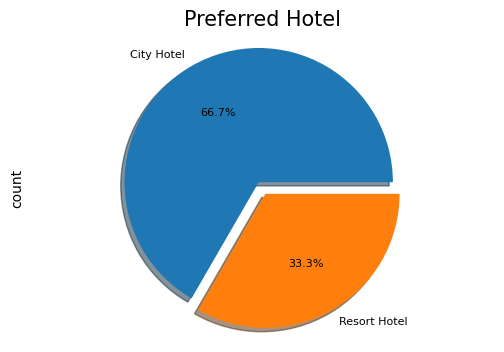

In [14]:
hotel_type = df['hotel'].value_counts()
hotel_type.plot.pie(explode=[0.05,0.05],autopct='%1.1f%%',shadow=True, figsize=(6,4),fontsize=8)
plt.title('Preferred Hotel', fontsize= 15 )
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

**1. Why did you pick the specific chart?**

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through area covered in a circle with different colors. Where differenet percentage comparison comes into action pie chart is used frequently. So, I used Pie chart and which helped us to get the percentage comparision more clearly and precisely.

**2. What is/are the insight(s) found from the chart?**

From the above chaart, I got to know that City Hotel is most preffered hotel by guests. Thus city hotels has maximum bookings 66.7% guests preffered city hotel while only 33.3% guests have shown interest in resort hotel.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, for both types of Hotels,this graph have some positive business impacts.

City Hotel are doing well so they are providing more services to attract more guests to increase more revenue. So,they are doing well .But in case of Resort Hotel, guest have shown less interest than city hotel so city hotel need to find solution to attract guests and find what city hotel have done to attract guests. So, there is an scope of tremendous growth in resort hotels if they updrade their services and adopt the path of growth and success learning from the success strategies of city hotels and adding new ideas of themselves.

### Chart 2: Hotel type with highest adr (Average Daily Rate)

Text(0.5, 1.0, 'Average ADR of Hotel')

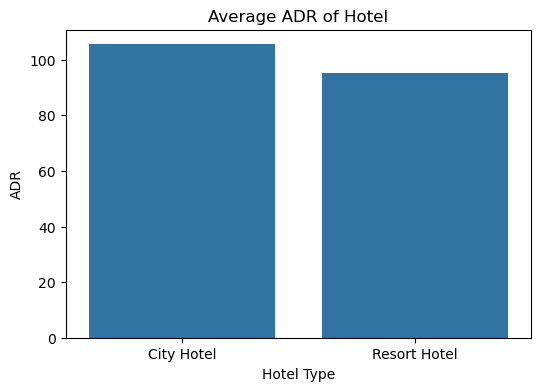

In [15]:
# group by hotel
hotel_group = df.groupby("hotel")

# grouping by hotel adr
highest_adr = hotel_group['adr'].mean().reset_index()

# Set plot size
plt.figure(figsize=(6,4))

# plot graph
sns.barplot(x=highest_adr['hotel'],y=highest_adr['adr'])

# set labels
plt.xlabel("Hotel Type")
plt.ylabel("ADR")
plt.title("Average ADR of Hotel")

**1. Why did you pick the specific chart?**

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable. Sometimes, bar charts show other statistics, such as percentages.

To show the average adr of each hotel type in a clear and flexible way, I have used Bar chart.

**2. What is/are the insight(s) found from the chart?**

City hotel has the highest ADR.This means city hotels are generating more revenues than the resort hotels. More the ADR more will be the revenue.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

So, City Hotel can do more advertising to get more customers that will ultimately add up their revenue. Thus, the city hotels are already enjoying high adr but a bit more of positive efforts towards growth will definitely adds to their growth and overall revenue.

### Chart 3: Hotel type with highest adr (Average Daily Rate)

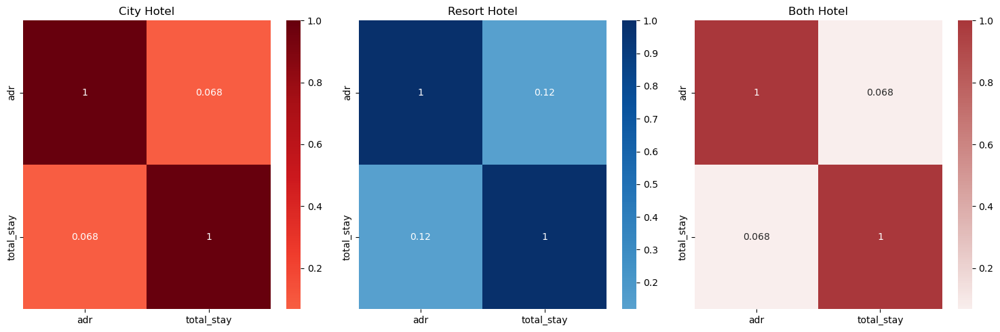

In [16]:
# Filter the data
city_data = df[df['hotel'] == 'City Hotel']
resort_data = df[df['hotel'] == 'Resort Hotel']

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Increased width for better spacing

# City hotel correlation heatmap
sns.heatmap(city_data[['adr', 'total_stay']].corr(), annot=True, cmap='Reds', center=0, ax=axes[0])
axes[0].set_title('City Hotel')

# Resort hotel correlation heatmap
sns.heatmap(resort_data[['adr', 'total_stay']].corr(), annot=True, cmap='Blues', center=0, ax=axes[1])
axes[1].set_title('Resort Hotel')

# Both hotel correlation heatmap
sns.heatmap(df[['adr', 'total_stay']].corr(), annot=True, cmap='vlag', center=0, ax=axes[2])
axes[2].set_title('Both Hotel')  # Fixed: set_title instead of set.title

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Relationship between ADR and total_stay')

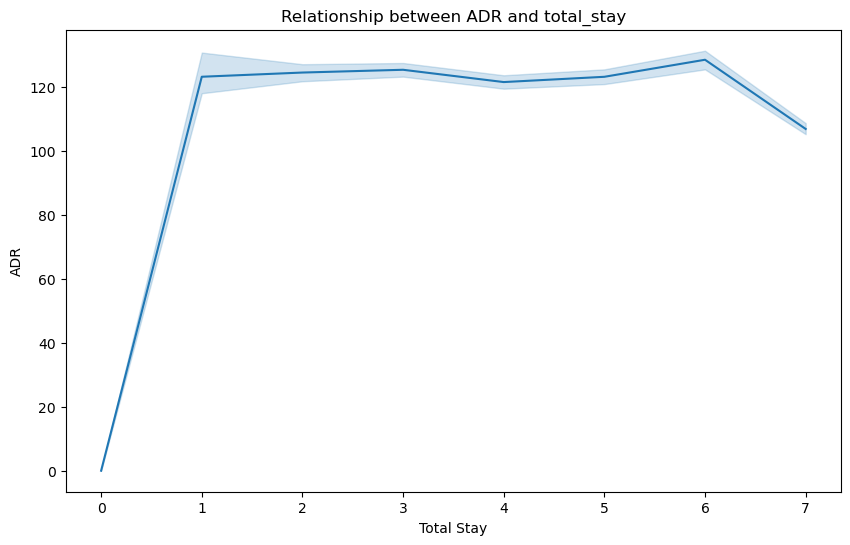

In [17]:
#Groupby total_stay,adr,hotel
adr_vs_stay = df.groupby(['total_stay','adr','hotel']).agg('count').reset_index ()
adr_vs_stay = adr_vs_stay.iloc[:, :3]
adr_vs_stay = adr_vs_stay.rename(columns={'is_canceled':'Number of stays'})
adr_vs_stay = adr_vs_stay[:18000]

#plotting the graph in linechart
plt.figure(figsize=(10,6))
sns.lineplot(x='total_stay',y='adr',data=adr_vs_stay)
plt.xlabel('Total Stay')
plt.ylabel('ADR')
plt.title('Relationship between ADR and total_stay')

**1. Why did you pick the specific chart?**

I chose heatmaps and a line chart because together they give both a detailed and overall view of the relationship between ADR and total stay. 

The heatmaps make it easy to see the density and correlation patterns within each hotel types, helping to identify whether customer behavior differs by category. On the other hand, the line chart provides a clear trend visualization of how ADR changes with total stay, making it easier to interpret the direction and strength of the relationship. By combining these charts, the analysis becomes both comparative and comprehensive.

**2. What is/are the insight(s) found from the chart?**

From the heatmaps, we can see that the correlation between ADR and total stay is very weak for both hotel types, with values of 0.068 for City Hotels and 0.12 for Resort Hotels, indicating that the length of stay does not strongly influence the room price. The combined data also shows a similarly weak correlation of 0.068, reinforcing that the relationship is consistent across both hotel types.

From the line chart, we observe that ADR initially spikes sharply around short stays (0–1 days) to nearly 120, but then remains relatively stable between 1 to 6 days, before slightly dropping to around 100 ADR at 7 days. This suggests that short stays tend to have higher ADR, while longer stays are associated with more stable or slightly lower pricing.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, the insights can create a positive business impact. The low correlation values (0.068 for City Hotel, 0.12 for Resort Hotel) show that ADR and total stay are not strongly linked, meaning pricing strategies can be adjusted more flexibly without heavily affecting stay duration. The line chart also shows ADR peaks for short stays (1 day), suggesting hotels can optimize pricing or offer promotions for longer stays to balance demand. There are no strong indicators of negative growth, only an opportunity to refine pricing strategies to encourage extended bookings.

### Chart 4: Percentage of repeated guests  

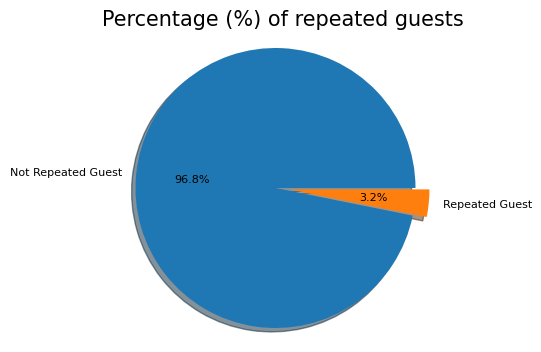

In [18]:
# Map the values in 'is_repeated_guest' to descriptive labels
repeated_guest_labels = {0: 'Not Repeated Guest', 1: 'Repeated Guest'}
repeated_guest_counts = df['is_repeated_guest'].map(repeated_guest_labels).value_counts()

# Plot the pie chart with updated labels
repeated_guest_counts.plot.pie(explode=[0.05,0.05],autopct='%1.1f%%',shadow=True, figsize=(6,4),fontsize=8, labels=repeated_guest_counts.index)

plt.title('Percentage (%) of repeated guests', fontsize= 15)
plt.ylabel('') # Remove the default 'count' label on the y-axis
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

**1. Why did you pick the specific chart?**

Pie charts are used to repeated the proportional data or relative data in a single chart. The concept of pie slices is used to show the percentage of a particular data from the whole pie. Thus,we have used to show the percentage of repeated guests or not(where 0 is not repeated guests and 1 is repeated guest) through pie chart with different colored area under a circle.

**2. What is/are the insight(s) found from the chart?**

Repeated guests are very few which is only 3.2% of guests are repeated, while 96.8% are first-time guests to the same hotel. So, its a matter of deep thinking and taking proper steps increase the repeated guests numbers. In order to retained the guests manangement should take feedbacks from guests and try to improve the services.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, the insights are useful for a positive business impact because they highlight a clear opportunity to improve guest retention. 

By introducing loyalty programs, personalized offers, or better guest experiences, the hotel can convert more first-time guests into repeat customers. Currently, the low percentage of repeated guests suggests a risk of negative growth, as the hotel is highly dependent on continuously acquiring new customers instead of building long-term loyalty.

### Chart 5: Meal type Distribution  

In [19]:
print("-"*30)
print(f"Total Undefined Meal Type is {df[df['meal']== "undefined"].shape[0]}")
print("-"*30)

------------------------------
Total Undefined Meal Type is 0
------------------------------


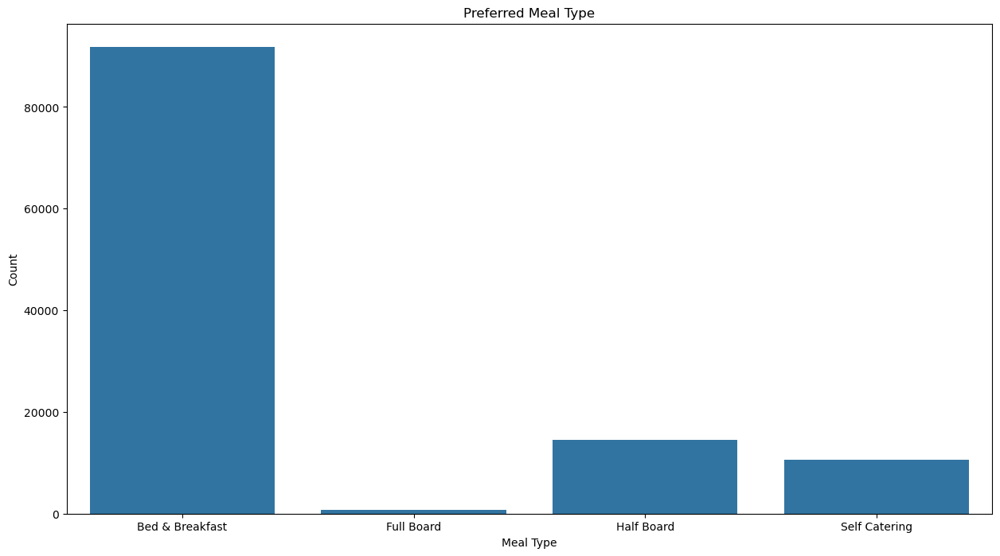

In [20]:
# Removing Uneccessary Meal Type "Undefined"
clean_df = df[df['meal'] != "Undefined"].copy()

# Map meal type abbreviations to full descriptions
meal_labels = {'BB': 'Bed & Breakfast', 'FB': 'Full Board', 'HB': 'Half Board', 'SC': 'Self Catering'}
clean_df['meal_description'] = clean_df['meal'].map(meal_labels)

# Ploting
plt.figure(figsize=(15,8))
sns.countplot(x=clean_df['meal_description'])
plt.xlabel('Meal Type')
plt.ylabel('Count')
plt.title('Preferred Meal Type')
plt.show()

**1. Why did you pick the specific chart?**

I chose a Bar Chart because it provides a clear and simple comparison between categories, such as meal types, and their numerical values, like booking counts. By looking at the bar lengths, we can immediately identify the most and least popular options, making the insights easy to understand at a glance.

**2. What is/are the insight(s) found from the chart?**

The chart highlights a clear trend:

- Strong Preference for Bed & Breakfast (BB): Guests overwhelmingly favor the “Bed & Breakfast” option, with bookings far surpassing all other meal types combined. For most visitors, BB appears to be the standard choice.

- Lower Demand for Other Options: Meal plans such as Half Board (HB), Full Board (FB), and Self Catering (SC) show comparatively minimal interest. These seem to cater to specific guest segments rather than the majority.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, absolutely. This insight is highly valuable for strategic planning and can directly enhance profitability.

- Marketing Focus: Since “Bed & Breakfast” is the most preferred option, the hotel can align its marketing campaigns and promotions around it. This ensures higher ROI from marketing efforts.

- Operational Efficiency: Kitchen resources, inventory, and staff schedules can be optimized around the B&B model. This minimizes waste, streamlines operations, and reduces costs, as less effort is needed for the less popular meal types.

- Pricing Strategy: The hotel can leverage B&B as the core offering while designing premium “Half Board” or “All-Inclusive” packages at higher margins for guests who want more.

**Risk of Negative Growth:** The insight itself does not drive negative growth, but ignoring it could. For example, if the hotel mistakenly assumes “Full Board” is in demand and invests heavily in promoting it or stocking expensive supplies for it, the return would likely be poor, leading to losses. This chart helps the hotel avoid such missteps.

### Chart 6: Percentage distribution of required_car_parking_spaces  

------------------------------------------------------------
Total Custoemrs Required 0 Car Parking Space are 111425.
Total Custoemrs Required 1 Car Parking Space are 7270.
Total Custoemrs Required 2 Car Parking Spaces are 28.
Total Custoemrs Required 3 Car Parking Spaces are 3.
Total Custoemrs Required 8 Car Parking Spaces are 2.
------------------------------------------------------------


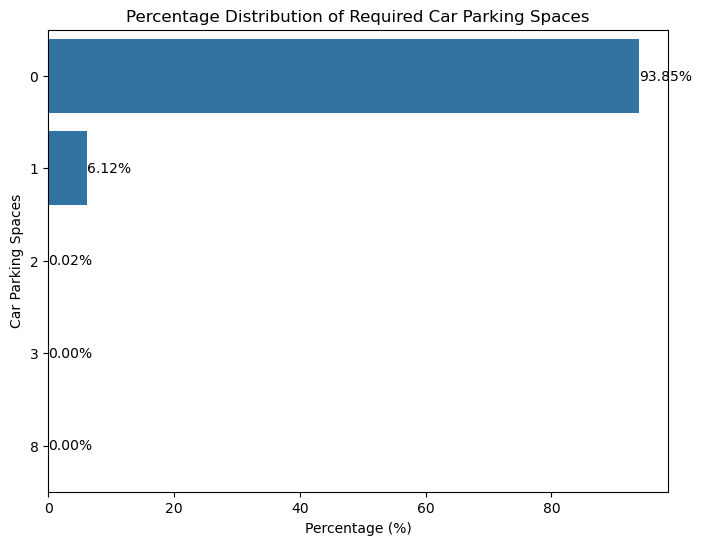

In [21]:
# Print the Total of each unique values in required_car_parking_spaces (0,1,2,3,8)
print('-'*60)
print(f"Total Custoemrs Required 0 Car Parking Space are {len(df[df['required_car_parking_spaces']==0])}.")
print(f"Total Custoemrs Required 1 Car Parking Space are {len(df[df['required_car_parking_spaces']==1])}.")
print(f"Total Custoemrs Required 2 Car Parking Spaces are {len(df[df['required_car_parking_spaces']==2])}.")
print(f"Total Custoemrs Required 3 Car Parking Spaces are {len(df[df['required_car_parking_spaces']==3])}.")
print(f"Total Custoemrs Required 8 Car Parking Spaces are {len(df[df['required_car_parking_spaces']==8])}.")
print('-'*60)

# Calculate the percentage of each value
parking_percentages = df['required_car_parking_spaces'].value_counts(normalize=True) * 100

# Create a horizontal bar plot
plt.figure(figsize=(8, 6))
ax = sns.barplot(x=parking_percentages.values, y=parking_percentages.index, orient='h')

# Add percentage labels next to each bar
ax.bar_label(ax.containers[0], fmt='%.2f%%')

plt.xlabel('Percentage (%)')
plt.ylabel('Car Parking Spaces')
plt.title('Percentage Distribution of Required Car Parking Spaces')
plt.show()

**1. Why did you pick the specific chart?**

I chose a horizontal bar chart with percentages because it makes it easy to compare the demand for different parking space requirements at a glance. Percentages give a clearer picture of how dominant each category is.

**2. What is/are the insight(s) found from the chart?**

The chart shows that 93.85% of customers do not require parking, while only 6.12% request one parking space. The demand for 2, 3, or 8 parking spaces is extremely rare (close to 0%). This indicates that most guests either don’t arrive by car or don’t require parking facilities.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, the insights will help create a positive business impact. Since parking demand is very low, the hotel can avoid over-investing in large parking facilities and instead allocate resources to areas that directly improve guest experience (like rooms, dining, or amenities). This prevents unnecessary costs and optimizes space usage.

There are no direct signs of negative growth; however, if the hotel ignores the 6.12% of guests who need parking and fails to provide sufficient spaces, it could lead to dissatisfaction or loss of those customers.

### Chart 7: MultiBar chart for mostly used Distribution Channel and Relationship Channel and adr  

Text(0.5, 1.0, 'ADR across Distribution Channel')

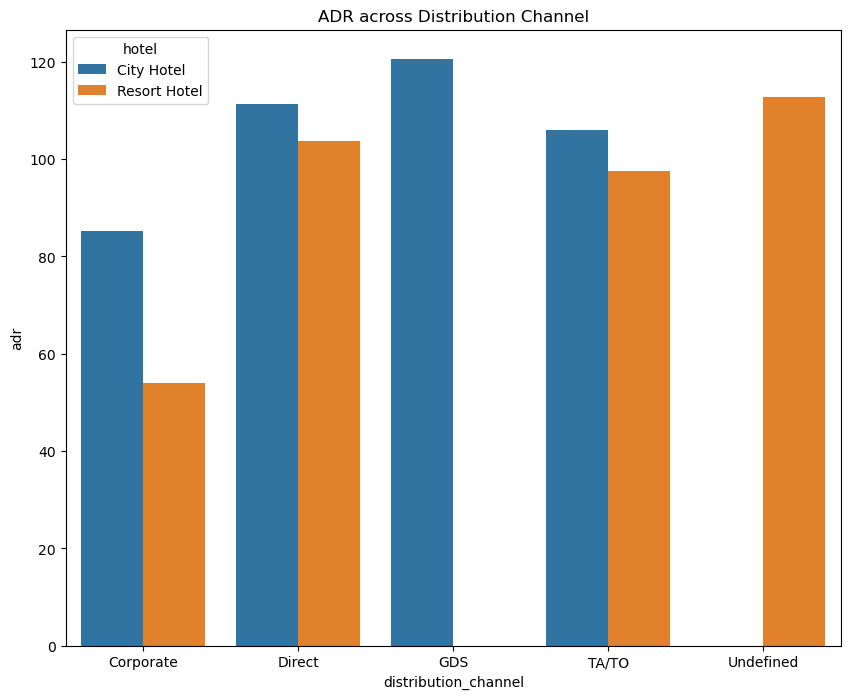

In [22]:
#using group by on distribution channel and hotel
distribution_channel_df = df.groupby(['distribution_channel','hotel'])['adr'].mean().reset_index()

#set plot size and plot barchart
plt.figure(figsize=(10,8))
sns.barplot(x='distribution_channel',y='adr',data=distribution_channel_df,hue='hotel')
plt.title('ADR across Distribution Channel')

**1. Why did you pick the specific chart?**

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable. Sometimes, bar charts show other statistics,such as percentage.To show the mean of adr with respect to the type of distribution channel,I have used bar charts. So,this graph will help us to know about values distribution channel and their contribution to adr in order to increase the income and revenue.

**2. What is/are the insight(s) found from the chart?**

It is claer that 'Direct' and 'TA/TO' have almost equally contribution in adr in both type of hotels i.e.'City Hotel'and 'Resort Hotel'. While, GDS has highly contributed in adr 'City Hotel' type. GDS n eeds to increase Resort Hotel Bookings. Corporate-These are corporate hotel booking companies which makes bookings possible. The definitions of abbrevations used in this graphs are as follows:-

- GDS - A GDS is a worldwide contact between travel bookers and suppliers,such as hotels and other accomodation providers. It communicates live products,price and availability data to travel agents and online booking engines and allows for automated transactions.

- Direct - means that bookings are directly made with the respective hotels.

- TA/TO - means that bookings are made through travel agents or travel operators.

- Undefined - bookings are undefined. It may be the reason that customers made their bookings on arrival.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, the gained insights from visualization will definitely help different distribution channel to work on the spaces where they are lacking behind like GDS is lackimg behind in the bookings of resort hotels. GDS is dominating in terms of adr in case of City hotels but lacking behind in the category of Resort hotel. So, just taking proper steps in the right direction will help to increase the overall revenue.

### Chart 8: Bookings by month and optimal stay length in hotels 

Text(0.5, 1.0, 'Bookings across each month')

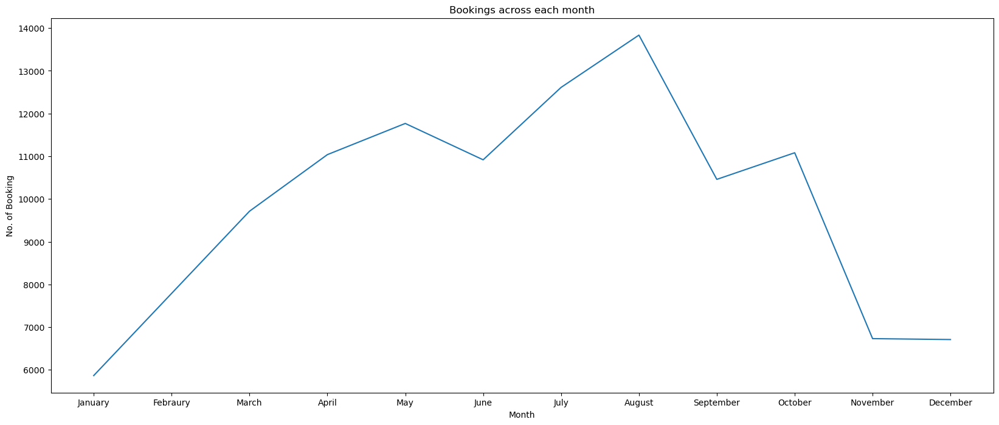

In [23]:
#Groupby total_stay,adr,hotel
bookings_by_months = df.groupby(['arrival_date_month'])['hotel'].count().reset_index().rename(columns={'hotel':"Counts"})
months = ['January','Febraury','March','April','May','June','July','August','September','October','November','December']
bookings_by_months['arrival_date_month']=pd.Categorical(bookings_by_months['arrival_date_month'],categories=months,ordered=True)
bookings_by_months_df = bookings_by_months.sort_values('arrival_date_month')

#plotting the graph in linechart
plt.figure(figsize=(20,8))
sns.lineplot(x=bookings_by_months['arrival_date_month'],y=bookings_by_months['Counts'])
plt.xlabel('Month')
plt.ylabel('No. of Booking')
plt.title('Bookings across each month')

Text(0.5, 1.0, 'Optimal stay length in both hotel types')

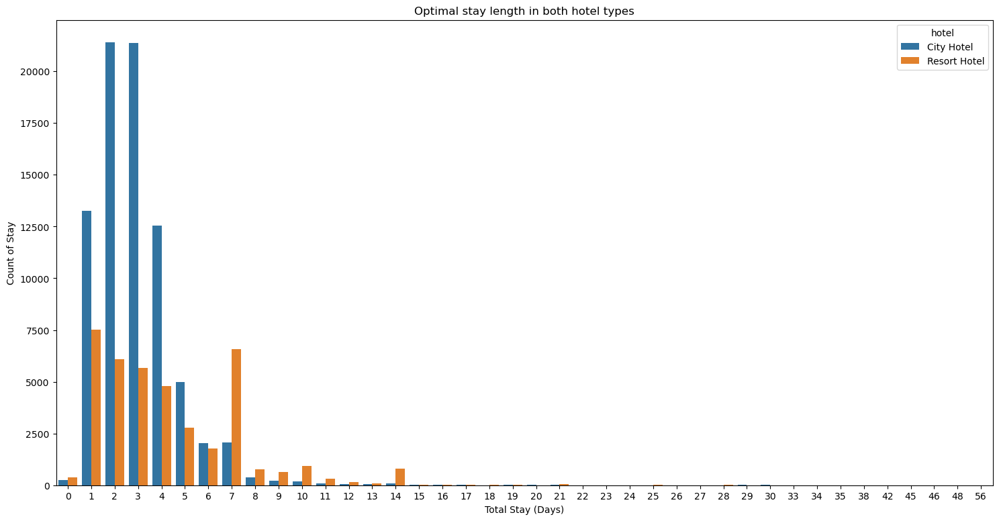

In [24]:
#using groupby function on total stay and hotel
stay = df.groupby(['total_stay','hotel']).agg('count').reset_index()
stay = stay.iloc[:, :3]
stay = stay.rename(columns={'is_canceled':'Number of stays'})

# Plot
plt.figure(figsize=(18,9))
sns.barplot(x='total_stay',y='Number of stays',hue='hotel',data=stay)
plt.xlabel('Total Stay (Days)')
plt.ylabel('Count of Stay')
plt.title('Optimal stay length in both hotel types')

**1. Why did you pick the specific chart?**

For 1st chart, we have picked the line chart here because it helps to show small shifts that may be getting hard to spot in other graphs.It helps show trends for different periods. They are easy to understand so here we can easily track the change of number of bookings with respect to month.

While in the 2nd chart here,bar plot has been used. we have used this chart to get clear view in understanding the relation between total stay in terms of days and count of stays(means total number of customers stayed)

**2. What is/are the insight(s) found from the chart?**

From this graph of 1st chart, we have found that july and august months had the most bookings. Ad,july and august generally surrounds in and near the summer vacation. So, summer vacation can be the reason for the bookings.

While, 2nd chart gives us diffeerent insights.So, from above observations we have found that the optimal stay in both the types hotel is less than 7days. So,after that staying numbers have declined drastically.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes,from the 1st chart, it is clear that this will provides a good insights that hotels should be well prepared for the month of July and August as maximum bookings takes place for this month. So, better the preparation and good approach will definetly adds to the growth of Hotels.

While 2nd chart also have positive impact. Yes, from the insights gathered here hotels can work in the domain to increase the staying length of customers to increase their revenue. The other understanding is that customers usually prefers a one week stay in a hotel so hotels need to work efficiently in these seven days so that customers would return to the same hotel again so this will increase the revenue.

### Chart 9: Plotting Histogram 

<function matplotlib.pyplot.show(close=None, block=None)>

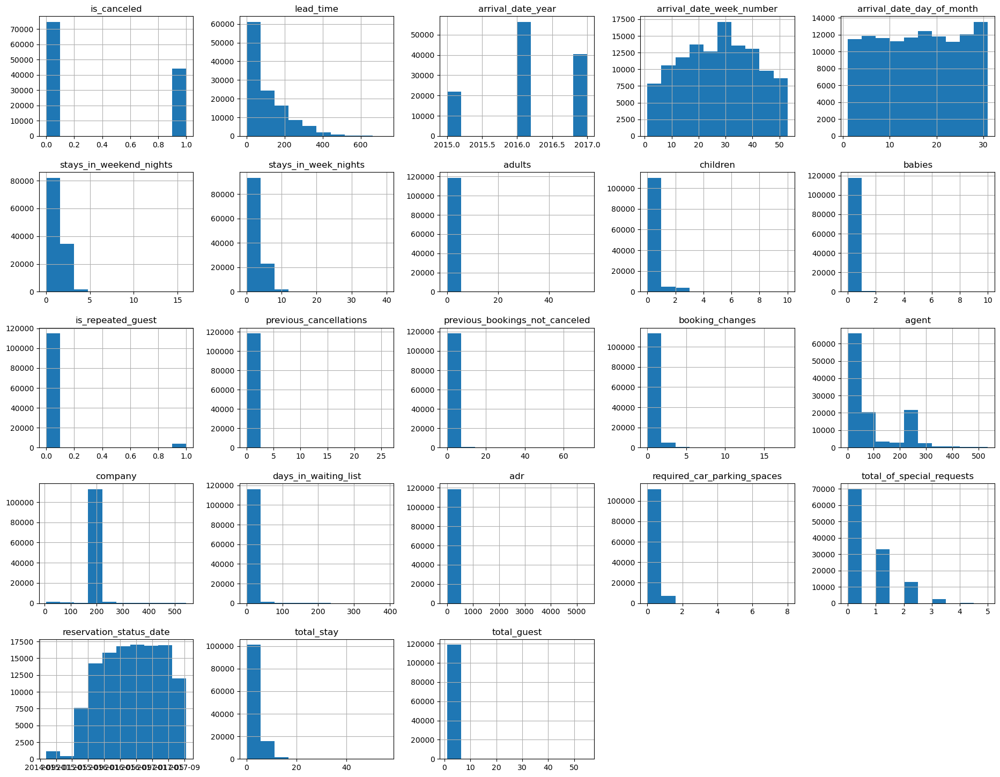

In [25]:
df.hist(figsize=(23,18))
plt.show

**1. Why did you pick the specific chart?**

To understand the data on a clear way with proper insights, I have used the histogram here. The histogram is a popular graphing tool. It is used to summarize discrete or continuous data that are measured on an interval scale. It is often used to illustrate the major features of the distribution of the data in a convenient form. It is also useful when dealing with large data sets(greater than 100 observations). It can help detect any usual observations(outliers) or any gaps in the data. Thus, we have used the histogram plot to analysis the variable distributions over the whole dataset whether its symmetric or not.

**2. What is/are the insight(s) found from the chart?**

Some insights founf form the chart are as follows:-

- We can see that the maximum guest came in the year 2016.

- Maximum arrival week number is 30.

- Maximum arrival happens in the last of the month.

- Maximum guests comes with no children.

- There is very less requirement of Car parking spaces.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Just a histogram cannot define business impact. Its done just to see the distribution of the column data over the dataset.

### Chart 10: Year and Hotel wise confirmed bookings and cancellation distribution

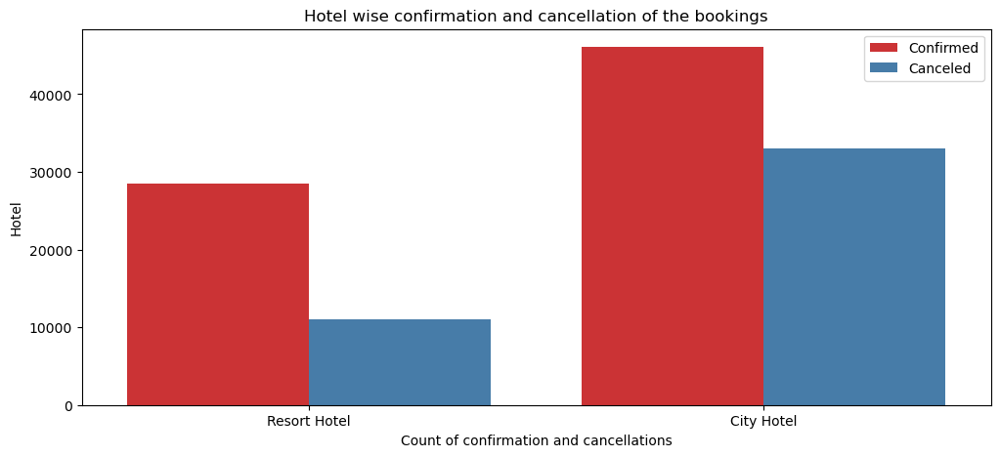

In [26]:
#plotting a count plot chart using seaborn for counts of confirmed and canceled bookings
plt.figure(figsize=(12,5))
sns.countplot(x='hotel',hue='is_canceled',palette='Set1',data=df)
plt.legend(['Confirmed','Canceled'])
plt.xlabel('Count of confirmation and cancellations')
plt.ylabel('Hotel')
plt.title('Hotel wise confirmation and cancellation of the bookings')
plt.show()

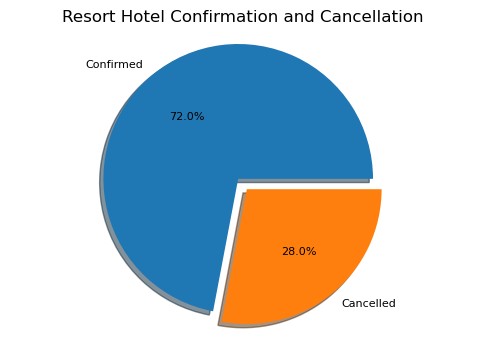

In [27]:
#plotting a pie chart using matplotlib for percentage of confirmed and canceled bookings of resort hotel
resort_hotel = df[df["hotel"] == "Resort Hotel"]
rh_checking_cancel = resort_hotel['is_canceled'].value_counts()

rh_checking_cancel.plot.pie(explode=[0.05,0.05],autopct='%1.1f%%',shadow=True, figsize=(6,4), fontsize=8, labels=["Confirmed","Cancelled"])

plt.title('Resort Hotel Confirmation and Cancellation')
plt.ylabel('') # Remove the default 'count' label on the y-axis
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

Text(0, 0.5, 'Number of bookings')

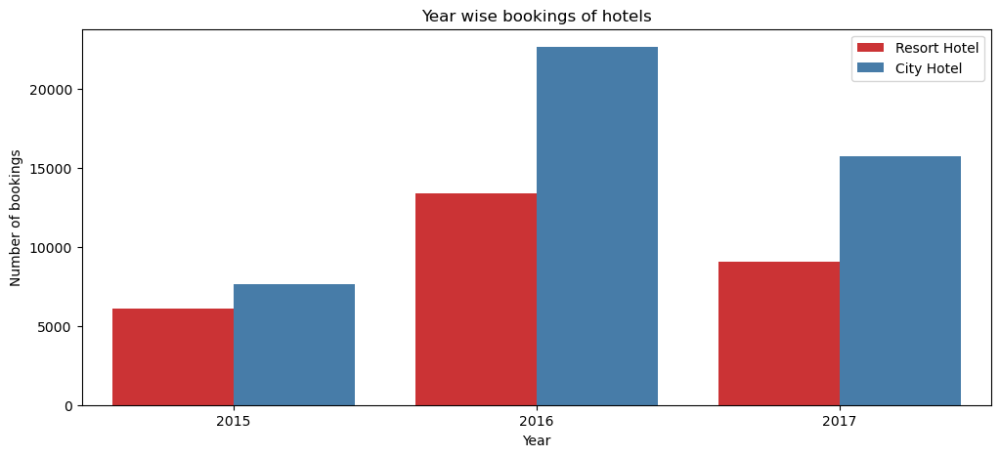

In [28]:
#removing the cancelled bookings from the data and creating a new dataframe
data_not_canceled = df[df['is_canceled']==0]

#year wise bookings of hotels
plt.figure(figsize=(12,5))
sns.countplot(x='arrival_date_year',hue='hotel',palette='Set1',data=data_not_canceled)
plt.legend(['Resort Hotel','City Hotel'])
plt.title("Year wise bookings of hotels")
plt.xlabel("Year")
plt.ylabel("Number of bookings")

**1. Why did you pick the specific chart?**

We here picked out the count plot and pie plot to get proper insights on the Hotel wise cancellation and confirmed of bookings.

**2. What is/are the insight(s) found from the chart?**

We can clearly deduce from the above graphs that the City Hotel is having greater number of bookings as compared to Resort hotel. But, the cancellation percentage is high of the City hotel.

From the above graphs, it can be summarised that in the year 2016 both the hotel sae a massive increase in their bookings and by far the year 2016 is the year of the highest bookings of both hotel. In each year that is 2015,2016 and 2017 the city hotel is having the highest number of bookings.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Overall the graphs show a positive outcome but the visualisation of cancellation graph creates a situation of deep concern. So. here as we can see that more than 1/4th of overall bookings got cancelled. So, its a matter of deep concern. Thus,we need to look over this problem. The solution to this problem is that we can check the reason of cancellation of a bookings and need to get this sorted out as soon as possible at the business level to stop the problem getting border.

### Chart 11: ADR across different months

Text(0.5, 1.0, 'ADR across each month')

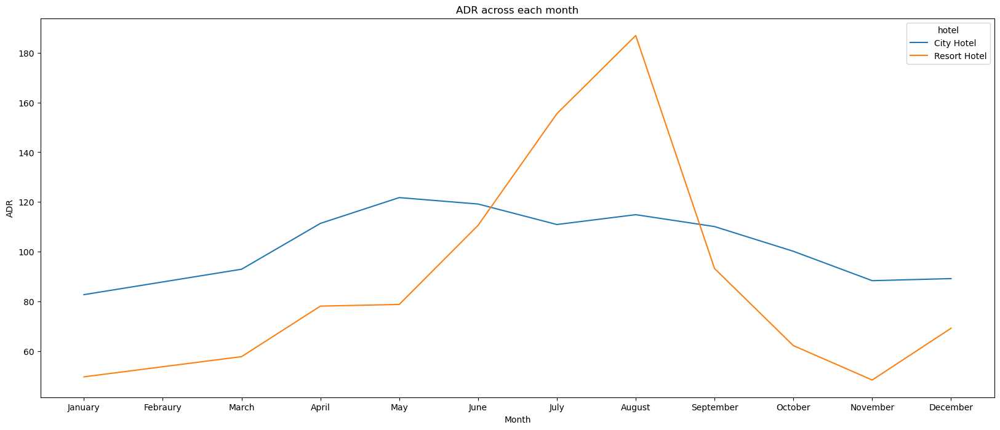

In [29]:
#Groupby total_stay,adr,hotel
bookings_by_month = df.groupby(['arrival_date_month','hotel'])['adr'].mean().reset_index()
bookings_by_month['arrival_date_month']=pd.Categorical(bookings_by_month['arrival_date_month'],categories=months,ordered=True)
bookings_by_month = bookings_by_month.sort_values('arrival_date_month')

#plotting the graph in linechart
plt.figure(figsize=(20,8))
sns.lineplot(x=bookings_by_month['arrival_date_month'],y=bookings_by_month['adr'],hue=bookings_by_month['hotel'])
plt.xlabel('Month')
plt.ylabel('ADR')
plt.title('ADR across each month')

**1. Why did you pick the specific chart?**

We have picked the line chart here to get the clear insights of adr by City and Resort Hotels across each month. Line chart is very useful because it helps to show shifts that may be getting hard to spot in other graphs. It helps show trends for different periods. They are easy to understand. To compare data, more than one line can be plotted on the same axis.

**2. What is/are the insight(s) found from the chart?**

- For Resort hotel,ADR is high in the months of June,July,August as compared to City Hotels. The reason may be that Customers/People want to spend their Summer Vacation in Resort Hotels.
- The best time for guests to visit Resort or City hotels is January,February,March,April,October,November and December as the average daily rate in this month is very low.So, it would be feasible and sustainable.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

So, the higher the adr,the higher will be the revenue so its a good sign. Hotels should work more to enchance their adr by offering good schemes to attract customers in winter vacation also and on other holidays.

### Chart 12: Weekly stay distribution and calculation of cancellation and non-cancellation

Text(0, 0.5, 'Number of stays')

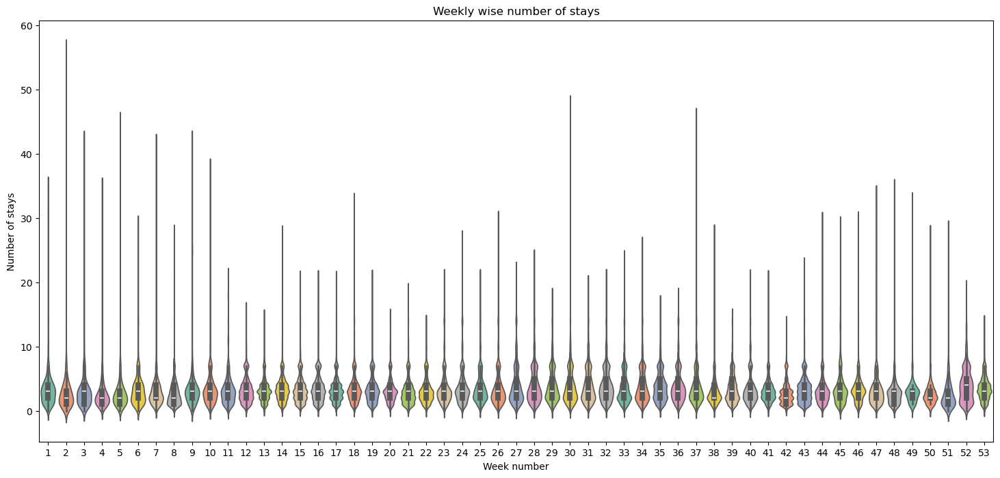

In [30]:
#using a violin plot to know in which weeks,visitors stays the most
plt.figure(figsize=(18,8))
sns.violinplot(x="arrival_date_week_number",y="total_stay",palette="Set2",data=df)
plt.title("Weekly wise number of stays")
plt.xlabel("Week number")
plt.ylabel("Number of stays")

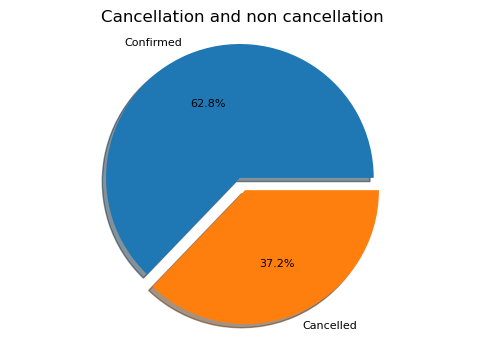

In [31]:
df['is_canceled'].value_counts().plot.pie(explode=[0.05,0.05], autopct='%1.1f%%',shadow=True, figsize=(6,4), fontsize=8, labels=["Confirmed","Cancelled"])
plt.ylabel("")
plt.axis("equal")
plt.title("Cancellation and non cancellation")
plt.show()

**1. Why did you pick the specific chart?**

We have used here the violin plot to gather proper relation between number of stays and week wise number of stays and violin plots are used when one want to observe the distribution of numeric data and are especially useful when you want to make a comparison of distribution between multiple groups. The peaks,valleys and tails of each groups density curve can be compared to see where groups are similar or different.

We have picked this pie plot as its look very precise and clear to get the insights between two variables. As we can see now 27.5% tickets was cancelled. Here O denotes not cancelled and 1 denotes the cancelled one. So,we have used the pie plot because it represents data visually as a fractional part of a whole, which can be an effective communication tool for the even uniformed audience to see a data comparison at a glance to make an immediate analysis or to understand information quickly.

**2. What is/are the insight(s) found from the chart?**

From the above violin plot,we have found that from the week 28 to 31, it has shown the highest days of stays whereas from the week 1 to 11 has shown a very steady trend in the number of stays and also the week 18 to 22 has shown the least number of stays by the visitors in aggregate of all 3 years 2015, 2016 and 2017.

From the graphs,we have found the insights that more than 1/4th of the overall bookings.i.e, approx 37.2% the tickets was got cancelled.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, according to the outcomes, client can have a better plan to provide better services to the guests so that the revenue cn be multipled.

So, here as we can see that more than 37% booking got cancelled. So, its a matter of deep concern. Thus, we need to look over this problem. The solution to this problem is that we can check the reasons of cancellation of a booking and need to get this sorted out as soon as possible at the business leevel to stop the problems getting broader.

### Chart 13: Room type preference and Customer types

Text(0.5, 1.0, 'Most preferred Room Type')

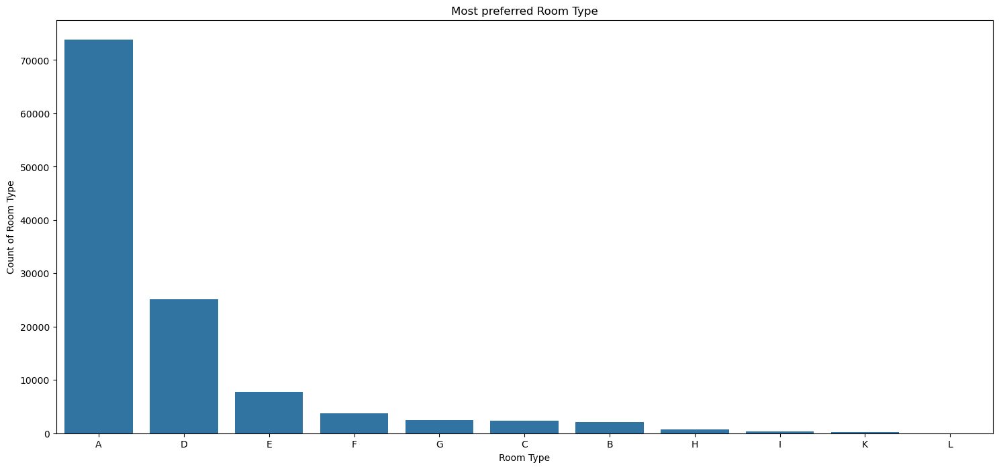

In [32]:
plt.figure(figsize=(18,8))
sns.countplot(x=df['assigned_room_type'],order=df['assigned_room_type'].value_counts().index)
plt.xlabel('Room Type')
plt.ylabel('Count of Room Type')
plt.title('Most preferred Room Type')

Text(0, 0.5, 'Number of Customers')

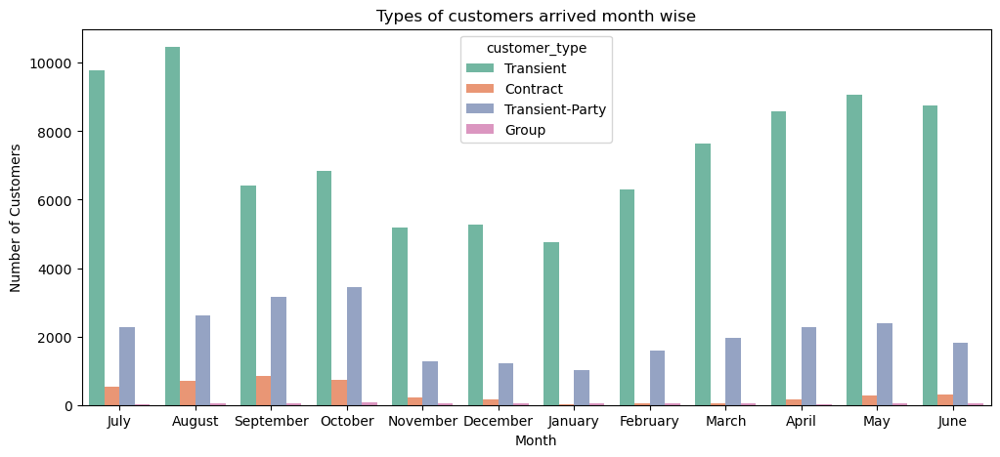

In [33]:
#using seaborn to plot a count to demonstrate the types of customers visit the most
plt.figure(figsize=(12,5))
sns.countplot(x='arrival_date_month',hue='customer_type',palette="Set2",data=df)
plt.title("Types of customers arrived month wise")
plt.xlabel("Month")
plt.ylabel("Number of Customers")

**1. Why did you pick the specific chart?**

For 1st visualiztion, we have picked the bar chart to display result for this set of code. Here, i have used bar graph to show distribution by volumn(count of room),which type of room is alotted. Bar graph summarises the largest set of data in simple visual form. It displays each category of data in the frequency distribution. It clarifies the trend of data better than the table. So, we have used the bar graph here.

While 2nd visualisation involves a count plot because it helps us to get clear insights with the total numberof guests visited. So, we have use count plot here to know about the type of guests.

**2. What is/are the insight(s) found from the chart?**

From, the above chart, it is found that the most preferred Room type is "A". So,majority of the guests have shown interest in this room type. So, overall this chart shows room type "A" is most preferred by guests.

From the above graph,it can be summarised that the Transient type of customers visit the most whereas the visitors who are in group comes in the category of least visitors.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, from the graph,it can be seen that there are positive impacts beacuse 'A','D','E' is more preferred by guest due to better services offered in room type. So, overall booking in a hotel matters. So, each room type belongs to each hotel so wherever customers goes,the hotel will be benefit but hotels should also look in the factors affecting less preferred in some particular room type. So,overall if other room types will also gain popularity then again hotel will be benefited. So, ultimately hotels will encounters more bookings resulting in much more revenues.

Of course the better understanding regarding the different types of guests will help to take proper right steps towards services,facilities,requirement and offers which will directly result in the growth in business.

### Chart 14: Correlation Heatmap

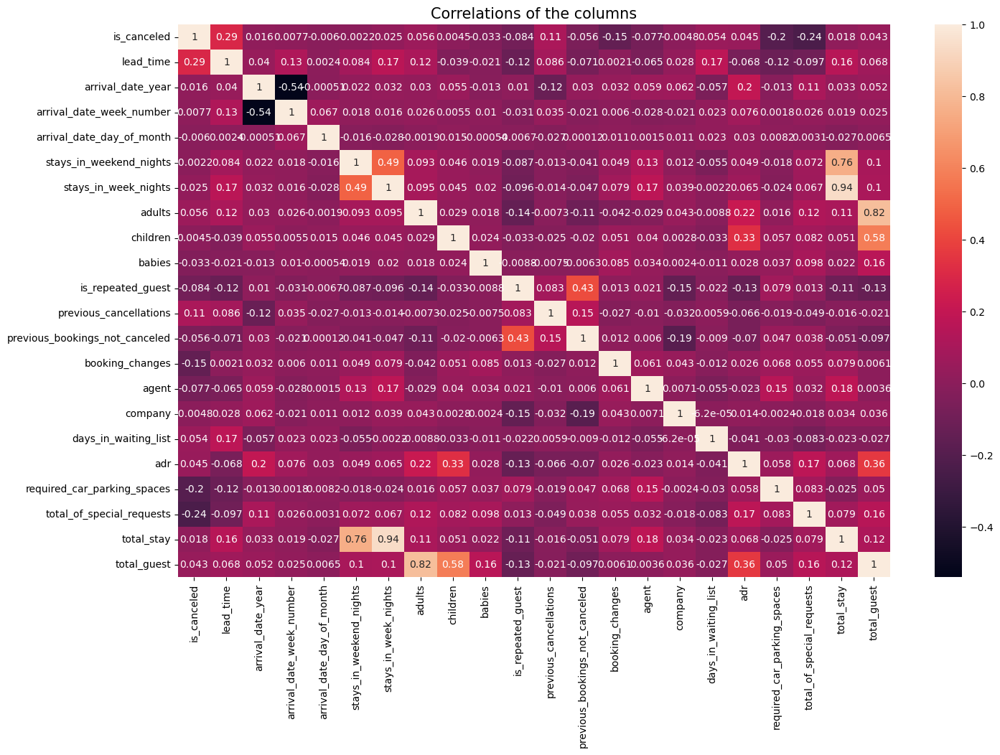

In [34]:
plt.figure(figsize=(16,10))
sns.heatmap(df.corr(numeric_only=True),annot=True)
plt.title('Correlations of the columns',fontsize=15)
plt.show()

**1. Why did you pick the specific chart?**

A correlation matrix is a table showing correlation coefficient between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarized data , as an input into a more advanced analysis, and as a diagnostic for advanced analyses. The range of correlation is [-1,1].

Thus, to know the correlation between all the variables along with the correlation coefficients. we have used correlation heatmap.

**2. What is/are the insight(s) found from the chart?**

The insights found from the above chart are as follows:-

- is_canceled and total_stay are negatively corelated. This means customers are unlikely to cancel their bookings if they dont get the same room as per reserved room. We have visualized it above.

- lead_time and total_stay is positively corelated. This means more the stay of customers is,more will be the lead time.

- Adults,childrens and babies are corelated to each other.This indicates more the people,more will be adr.

- is_repeated guest and previous bookings not canceled have a strong corelation.This may be due to the reason that repeated guests are not more interestd to cancel their bookings.

- So, these are some powerful insights found from the charts of correlation heatmap.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, the gained insights will definitely help in creating a positive business impact.

- The negative correlation between cancellations and total stay helps hotels identify that long-stay guests are more reliable. This allows for better forecasting and revenue management.

- The positive correlation between lead time and stay duration can guide pricing strategies, promotions, and inventory planning for advance bookings.

- The correlation among adults, children, and babies with ADR highlights the opportunity to design bundled family packages or upsell larger room types for higher revenue.

- The strong link between repeated guests and fewer cancellations shows the importance of loyalty. By nurturing repeat customers with personalized offers or rewards, the hotel can ensure stable business growth.

**Risk of Negative Growth:** The insights themselves do not lead to negative growth. However, ignoring them could. For example, if hotels fail to recognize the reliability of repeated or long-stay guests and instead over-focus on short-stay or first-time customers, cancellations may increase, leading to lost revenue and wasted resources.

### Chart 15: Pair plot

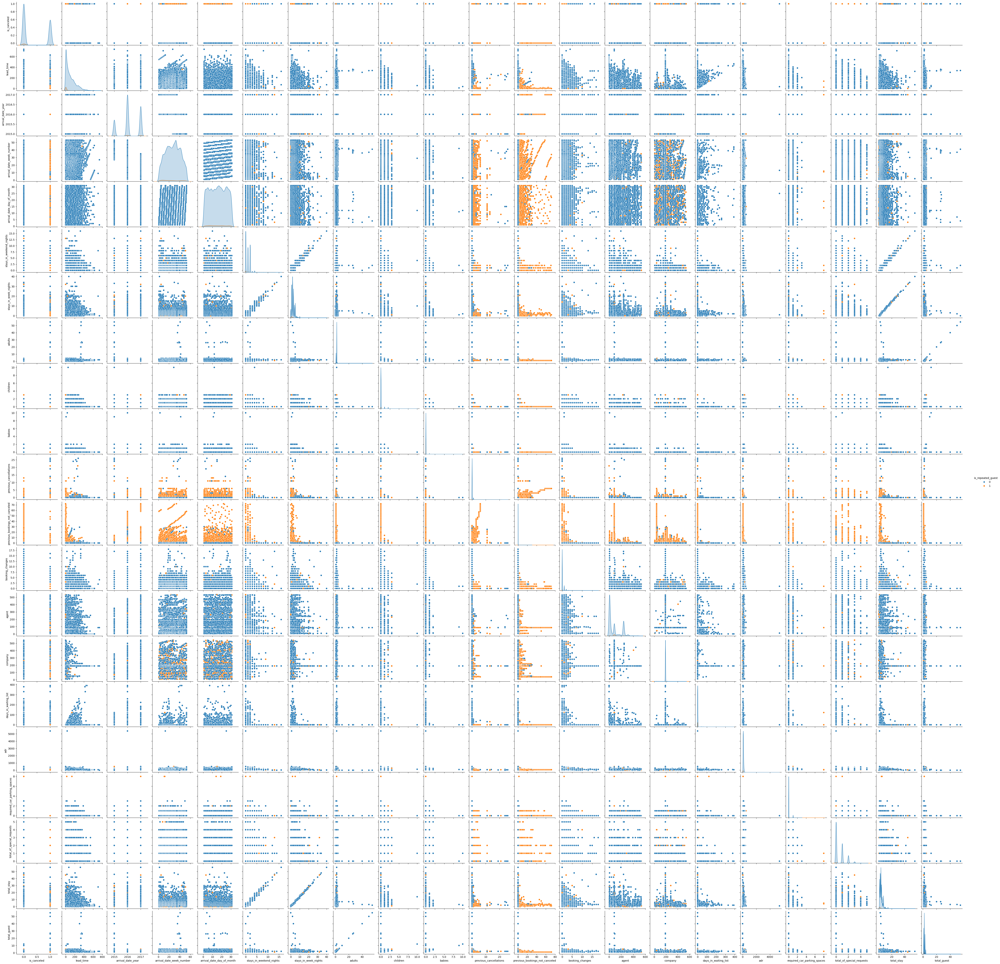

In [35]:
# Pair Plot for Repeated Guest
sns.pairplot(df, hue="is_repeated_guest")

**1. Why did you pick the specific chart?**

Pair plot is used to understand the best set of features to explian a relationship between two variables or to form the most separated clusters. It also helps to form some simple classification models by drawing some simple lines or make linear separation in our data-set.

Thus, we have pair plot to analyse the patterns of data and relationship between the features. Its exactly same as the correlation map but here it shows the output in the graphical representation.

**2. What is/are the insight(s) found from the chart?**

We have found the relationship of "is_repeated_guest" with different types of columns. So, generally this chart reflects the relationship of a particular column with all other column.

**3. Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.**

Yes, the insights from the pairplot can help create a positive business impact. By analyzing how repeated guests relate to different variables like booking lead time, cancellations, special requests, room type, or ADR, the hotel can identify patterns of loyalty and behavior. For example, repeated guests may book through specific channels, request fewer cancellations, or prefer certain room types. This information helps the hotel design targeted loyalty programs, personalize offers, and improve guest retention, which directly boosts revenue.

There are no direct signs of negative growth in the insight itself, but ignoring it could be risky. If the hotel overlooks what repeated guests value and continues to focus only on first-time guests, it may lose opportunities for building long-term loyalty. Repeated guests often contribute to steady revenue and lower acquisition costs, so not acting on these insights could result in missed growth and higher dependence on acquiring new customers.

## Solution to Business Objective

**What do you suggest the client to achieve Business Objective ?**

Business Objective Achievement:

- For sustained growth and long-term success, the hotel business must focus on three key areas: revenue generation, customer satisfaction, and employee retention.

- These objectives were addressed by identifying the months with the highest revenue potential, using various charts and graphical distributions to present clear insights to the client.

- Revenue opportunities were further explored through bar chart analysis of room type preferences and seasonal demand patterns, highlighting which room categories are most reserved and which months attract the most visitors.

- Additional insights were derived regarding guest preferences in multiple categories, such as the most preferred meal type, optimal stay duration, and requirements for facilities like car parking spaces. Collectively, these findings support more effective planning for revenue growth.

- By leveraging these outcomes, the client can prepare in advance, reduce potential guest grievances, and strengthen their hospitality offerings, leading to higher satisfaction and loyalty.

- Finally, incorporating regular guest feedback is recommended to continuously upgrade service quality and attract a larger customer base.

## Summarised Conclusion

In conclusion, the analysis highlights several key insights into hotel reservations. City Hotels emerged as the most preferred and busiest hotel type, not only attracting more guests but also generating higher ADR and overall revenue compared to Resort Hotels. The study found that longer stays are directly proportional to higher ADR and revenue, emphasizing the importance of encouraging extended bookings. However, guest retention remains a challenge, with only 3.9% repeat customers and the majority being new guests. Interestingly, the demand for car parking spaces is minimal, indicating that parking does not significantly impact business. In terms of guest preferences, Bed & Breakfast is the most popular meal plan, while Room Type A dominates reservations. From a distribution perspective, TA/TO is the primary booking channel, contributing to nearly 79.1% of all bookings, with GDS making a significant impact on City Hotel ADR. Seasonal trends also play an important role, with July and August being peak months for bookings, and Resort Hotels achieving higher ADR during the summer months (June–August). Additionally, the analysis revealed that the optimal stay length is usually less than a week, after which demand drops sharply. Finally, one major concern is that 37.5% of bookings were canceled, underlining the need for better cancellation management strategies. Collectively, these insights provide a strong foundation for strategic decision-making to enhance revenue, guest satisfaction, and long-term business growth.